In [15]:
#Evaluating the model on test data
results = model.evaluate(test_ds)


6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - idh1_mut_output_accuracy: 1.0000 - idh1_mut_output_loss: 0.0013 - idh2_mut_output_accuracy: 1.0000 - idh2_mut_output_loss: 1.1522e-04 - loss: 0.5926 - mask_array_output_iou: 0.7544 - mask_array_output_loss: 0.1171 - mgmt_meth_output_accuracy: 1.0000 - mgmt_meth_output_loss: 0.0023 - primary_diag_output_accuracy: 1.0000 - primary_diag_output_loss: 0.0021 - second_prog_output_accuracy: 1.0000 - second_prog_output_loss: 0.0043


In [22]:
#Comaparing true masks vs predicted ones
import plotly.graph_objects as go

sample_index = 2  # change to visualize another sample

# Get a batch from the test set
for (x_batch, y_batch) in test_ds.take(1):
    image_batch, tabular_batch = x_batch
    true_masks = y_batch[0]  # segmentation masks
    break

# Predict on the same batch
preds = model.predict_on_batch(x_batch)

# Extract sample
image_np = image_batch[sample_index].numpy().squeeze()
true_mask_np = true_masks[sample_index].numpy().squeeze()
pred_mask_np = preds[0][sample_index].squeeze()

# Binarize masks
true_mask_np = (true_mask_np > 0.5).astype(np.uint8)
pred_mask_np = (pred_mask_np > 0.5).astype(np.uint8)


# ========================
# 1. True Mask 3D
# ========================
z, y, x = np.indices(true_mask_np.shape)
fig_true = go.Figure()
fig_true.add_trace(go.Volume(
    x=x.flatten(), y=y.flatten(), z=z.flatten(),
    value=true_mask_np.flatten(),
    isomin=0.5, isomax=1,
    opacity=0.2, surface_count=15,
    colorscale='Blues', showscale=False
))
fig_true.update_layout(title="True Mask", width=700, height=700)
fig_true.show()



In [23]:
# ========================
# 2. Predicted Mask 3D
# ========================
fig_pred = go.Figure()
fig_pred.add_trace(go.Volume(
    x=x.flatten(), y=y.flatten(), z=z.flatten(),
    value=pred_mask_np.flatten(),
    isomin=0.5, isomax=1,
    opacity=0.2, surface_count=15,
    colorscale='Reds', showscale=False
))
fig_pred.update_layout(title="Predicted Mask", width=700, height=700)
fig_pred.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


/tmp/ipykernel_35/368251694.py:66: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



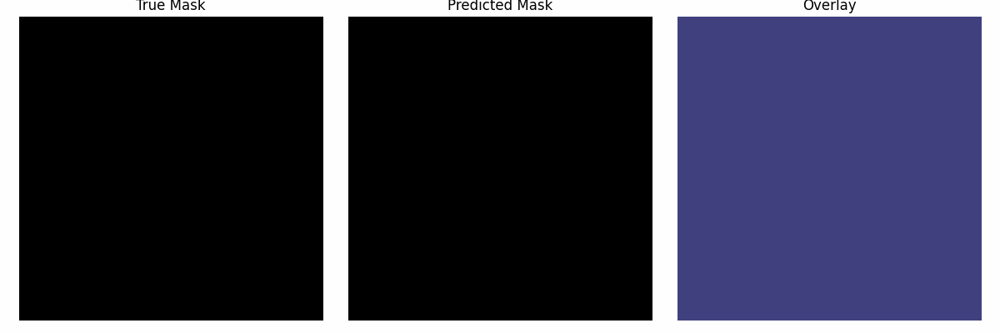

Other outputs comparison for sample index: 3
Primary Diagnosis: True = 2, Predicted = 2
Second Progression: True = 1, Predicted = 0
IDH1 Mutation: True = 0, Predicted = 0
IDH2 Mutation: True = 0, Predicted = 0
MGMT Methylation: True = 0, Predicted = 0


In [26]:
# Predict a batch of test images and other outputs


from IPython.display import Image, display
import imageio

for (x_batch, y_batch) in test_ds.take(1):  # one batch
    image_batch, tabular_batch = x_batch
    true_masks = y_batch[0]  # true segmentation masks

    # Other true outputs (assuming y_batch is a tuple: (mask, primary_diag, second_prog, idh1_mut, idh2_mut, mgmt_meth))
    true_primary_diag = y_batch[1].numpy()
    true_second_prog = y_batch[2].numpy()
    true_idh1_mut = y_batch[3].numpy()
    true_idh2_mut = y_batch[4].numpy()
    true_mgmt_meth = y_batch[5].numpy()
    break

# Predict outputs: model returns a tuple, first is mask, others follow in order
predictions = model.predict((image_batch, tabular_batch))
predicted_masks = predictions[0]

pred_primary_diag = predictions[1]
pred_second_prog = predictions[2]
pred_idh1_mut = predictions[3]
pred_idh2_mut = predictions[4]
pred_mgmt_meth = predictions[5]

# Select sample index
sample_index = 3

# Process masks for visualization (same as your original code)
true_mask_np = true_masks[sample_index].numpy()
predicted_mask_np = predicted_masks[sample_index]

true_mask_np = np.squeeze(true_mask_np)        # shape: (H, W, D)
predicted_mask_np = np.squeeze(predicted_mask_np)
predicted_mask_np = (predicted_mask_np > 0.5).astype(np.uint8)  # binarize

# Create output folder
os.makedirs("gif_frames", exist_ok=True)

# Generate GIF frames
frames = []
for i in range(true_mask_np.shape[2]):  # iterate over slices
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    
    axs[0].imshow(true_mask_np[:, :, i], cmap='gray')
    axs[0].set_title("True Mask")
    axs[0].axis('off')

    axs[1].imshow(predicted_mask_np[:, :, i], cmap='gray')
    axs[1].set_title("Predicted Mask")
    axs[1].axis('off')

    axs[2].imshow(true_mask_np[:, :, i], cmap='gray', alpha=0.5)
    axs[2].imshow(predicted_mask_np[:, :, i], cmap='jet', alpha=0.5)
    axs[2].set_title("Overlay")
    axs[2].axis('off')

    filename = f"gif_frames/frame_{i:03d}.png"
    plt.tight_layout()
    plt.savefig(filename)
    plt.close(fig)
    
    frames.append(imageio.imread(filename))

# Save GIF
gif_path = "pred_vs_true.gif"
imageio.mimsave(gif_path, frames, fps=5)

# Display the GIF
display(Image(filename=gif_path))

# Now print the other true vs predicted outputs for this sample

def get_pred_label(pred_array, sample_idx):
    pred_sample = pred_array[sample_idx]
    if pred_sample.ndim > 0:  # vector, classification probs
        return np.argmax(pred_sample)
    else:
        return pred_sample  # scalar regression

print("Other outputs comparison for sample index:", sample_index)

print(f"Primary Diagnosis: True = {int(true_primary_diag[sample_index])}, Predicted = {get_pred_label(pred_primary_diag, sample_index)}")
print(f"Second Progression: True = {int(true_second_prog[sample_index])}, Predicted = {get_pred_label(pred_second_prog, sample_index)}")
print(f"IDH1 Mutation: True = {int(true_idh1_mut[sample_index])}, Predicted = {get_pred_label(pred_idh1_mut, sample_index)}")

# Convert one-hot true labels to class indices
true_idh2_label = np.argmax(true_idh2_mut[sample_index])
print(f"IDH2 Mutation: True = {true_idh2_label}, Predicted = {get_pred_label(pred_idh2_mut, sample_index)}")

true_mgmt_label = np.argmax(true_mgmt_meth[sample_index])
print(f"MGMT Methylation: True = {true_mgmt_label}, Predicted = {get_pred_label(pred_mgmt_meth, sample_index)}")


